**Мугинова Олеся Алексеевна**

## **Часть 1**

Обработать файл с помощью регулярных выражений, убрать лишние символы, оставить только абстракты

In [ ]:
import re

In [ ]:
text = open('HW1.txt', 'r')

In [ ]:
with open('HW1.txt', encoding="ISO-8859-1") as text:
    contents = text.read()

In [ ]:
contents 

'        Key:    3\n    Medline:\n    Authors: Abdulkader N;Brun JL\n      Title: Induction, detection and isolation of temperature-sensitive\n             lethal and/or sterile mutants in nematodes. I. The\n             free-living nematode C. elegans.\n   Citation: Revue de Nematologie 1: 27-37 1978\n       Type: ARTICLE\n      Genes:\n   Abstract: Applying a series of techniques intended to induce, detect\n             and isolate lethal and/or sterile temperature-sensitive\n             mutants, specific to the self-fertilizing hermaphrodite\n             nematode Caenorhabditis elegans, Bergerac strain, 25 such\n             mutants have been found.  Optimal conditions for the\n             application of mutagenic treatment and the detection of\n             such mutations are discussed.\n             -------------------\n        Key:    5\n    Medline:\n    Authors: Abi-Rached M;Brun JL\n      Title: Etude ultrastructurale des relations entre ovocytes et\n             rachis au 

Оставляем только абстракты

In [ ]:
abstract = [re.findall(r"Abstract: (.*)", i, flags=re.DOTALL) for i in re.split(r'[-]+.*\-', contents)]

In [ ]:
abstract

[['Applying a series of techniques intended to induce, detect\n             and isolate lethal and/or sterile temperature-sensitive\n             mutants, specific to the self-fertilizing hermaphrodite\n             nematode Caenorhabditis elegans, Bergerac strain, 25 such\n             mutants have been found.  Optimal conditions for the\n             application of mutagenic treatment and the detection of\n             such mutations are discussed.\n             '],
 ['Before diakinesis, the development of the oocytes of C.\n             elegans takes place in the presence of a specific\n             anatomical structure: the rachis.  This is an undivided,\n             anucleated cytoplasmic mass placed in the central part of\n             the ovary.  Electron microscopy shows that, at first, in\n             the gonial region, it is made of two branches which\n             infiltrate themselves between the oogonia and then converge\n             in a single axial column.  Afterward

Ура, мы получили тезисы, теперь нужно почистить текст, для начала удалим пустые списки, которые лежат внутри абстрактов

In [ ]:
abstracts = [i for i in abstract if i]

In [ ]:
abstracts

[['Applying a series of techniques intended to induce, detect\n             and isolate lethal and/or sterile temperature-sensitive\n             mutants, specific to the self-fertilizing hermaphrodite\n             nematode Caenorhabditis elegans, Bergerac strain, 25 such\n             mutants have been found.  Optimal conditions for the\n             application of mutagenic treatment and the detection of\n             such mutations are discussed.\n             '],
 ['Before diakinesis, the development of the oocytes of C.\n             elegans takes place in the presence of a specific\n             anatomical structure: the rachis.  This is an undivided,\n             anucleated cytoplasmic mass placed in the central part of\n             the ovary.  Electron microscopy shows that, at first, in\n             the gonial region, it is made of two branches which\n             infiltrate themselves between the oogonia and then converge\n             in a single axial column.  Afterward

Теперь удалим элементы, которые мешают визуально прочитывать текст и которые не дают информационной нагрузки: 
* разрыв строки и лишние пробелы
* знаки препинания
* числа

In [ ]:
for i in range(len(abstracts)):
  abstracts[i][0] = re.sub(r'\n', '', abstracts[i][0]) #удаляем разрыв строки 
  abstracts[i][0] = re.sub(r' +', ' ', abstracts[i][0]) #удаляем лишние пробелы
  abstracts[i][0] = re.sub(r'[^\w\s]', '', abstracts[i][0]) #удаляем пунктуацию
  abstracts[i][0] = re.sub(r'\w*\d\w*', '', abstracts[i][0]).strip() #удаляем числа

Смотрим на пример abstract

In [ ]:
abstracts[1][0]

'Before diakinesis the development of the oocytes of C elegans takes place in the presence of a specific anatomical structure the rachis This is an undivided anucleated cytoplasmic mass placed in the central part of the ovary Electron microscopy shows that at first in the gonial region it is made of two branches which infiltrate themselves between the oogonia and then converge in a single axial column Afterwards this column will be pushed to the outside of the gonad and will disappear when the great oocyte increase takes place Until then the rachis is limited by its own envelope and connects each germinal cell through a pore present in the double layered membrane The cytoplasmic bridge established between the oogonia and the rachis the presence of a typical Golgi apparatus and of numerous mitochondria in the rachis strongly suggest that the rachis plays a role in the oocyte'

Все чистенько, переходим к предобработке текста

## **Часть 2**

Preprocessing

In [ ]:
import nltk
from nltk.tokenize import word_tokenize

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
#tokinize
text1 = [word_tokenize(document[0]) for document in abstracts]

In [ ]:
print(text1[10])

['a', 'new', 'method', 'of', 'isolating', 'mutants', 'of', 'the', 'freeliving', 'nematode', 'caenorhabditis', 'elegans', 'is', 'described', 'this', 'method', 'utilizes', 'the', 'fluorescence', 'of', 'the', 'nematode', 'as', 'the', 'phenotype', 'mutants', 'belonging', 'to', 'four', 'genes', 'obtained', 'using', 'this', 'technique', 'have', 'been', 'characterised', 'mutants', 'in', 'two', 'of', 'these', 'genes', 'are', 'shown', 'to', 'have', 'blocks', 'in', 'tryptophan', 'catabolism', 'it', 'is', 'suggested', 'that', 'this', 'method', 'could', 'be', 'used', 'to', 'obtain', 'mutants', 'corresponding', 'to', 'blocks', 'in', 'other', 'metabolic', 'pathways', 'with', 'fluorescent', 'end', 'products']


In [ ]:
#тут вторая интерация по удалению пробелов, но может мы что-то пропустиили, так что лишним не будет
text1 = [
     [token.strip().lower() for token in document]
     for document in text1]

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
#удалим стоп-слова
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))
stopwords_text = [
     [word for word in document if word not in stopwords]
     for document in text1
 ]

In [ ]:
print(stopwords_text[10])

['new', 'method', 'isolating', 'mutants', 'freeliving', 'nematode', 'caenorhabditis', 'elegans', 'described', 'method', 'utilizes', 'fluorescence', 'nematode', 'phenotype', 'mutants', 'belonging', 'four', 'genes', 'obtained', 'using', 'technique', 'characterised', 'mutants', 'two', 'genes', 'shown', 'blocks', 'tryptophan', 'catabolism', 'suggested', 'method', 'could', 'used', 'obtain', 'mutants', 'corresponding', 'blocks', 'metabolic', 'pathways', 'fluorescent', 'end', 'products']


На этом примере хорошо видно, что  у нас ушли предлоги и артикли типа: a, the, of, to. Также ушли некоторые глаголы, которые не дают информационной нагрузки тексту.

еще раз проверим удаление пунктцации

In [ ]:
from string import punctuation

In [ ]:
punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
punctuation += '--'
punctuation += "..."
punctuation +="========================================================================"
punctuation += "''"
punctuation += "``"
punctuation += "wa"
punctuation_text = [
     [word for word in document if word not in punctuation]
     for document in stopwords_text
 ]

In [ ]:
print(punctuation_text[10])

['new', 'method', 'isolating', 'mutants', 'freeliving', 'nematode', 'caenorhabditis', 'elegans', 'described', 'method', 'utilizes', 'fluorescence', 'nematode', 'phenotype', 'mutants', 'belonging', 'four', 'genes', 'obtained', 'using', 'technique', 'characterised', 'mutants', 'two', 'genes', 'shown', 'blocks', 'tryptophan', 'catabolism', 'suggested', 'method', 'could', 'used', 'obtain', 'mutants', 'corresponding', 'blocks', 'metabolic', 'pathways', 'fluorescent', 'end', 'products']


In [ ]:
#посмотрим еще на другой текст, вдруг что-то пропустили
print(punctuation_text[0])

['applying', 'series', 'techniques', 'intended', 'induce', 'detect', 'isolate', 'lethal', 'andor', 'sterile', 'temperaturesensitive', 'mutants', 'specific', 'selffertilizing', 'hermaphrodite', 'nematode', 'caenorhabditis', 'elegans', 'bergerac', 'strain', 'mutants', 'found', 'optimal', 'conditions', 'application', 'mutagenic', 'treatment', 'detection', 'mutations', 'discussed']


В целом все выглядит прилично

После токенизации, удаления лишних пробелов, стоп слов и пунктуации можем переходить к лемматизации

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
lematizer = nltk.stem.WordNetLemmatizer()
lem_text = [
     [lematizer.lemmatize(token) for token in document]
     for document in punctuation_text]

In [ ]:
#и удаляем стоп слова еще раз 
lem_text = [
     [word for word in document if word not in stopwords]
     for document in lem_text
 ]

In [ ]:
print(lem_text[10])

['new', 'method', 'isolating', 'mutant', 'freeliving', 'nematode', 'caenorhabditis', 'elegans', 'described', 'method', 'utilizes', 'fluorescence', 'nematode', 'phenotype', 'mutant', 'belonging', 'four', 'gene', 'obtained', 'using', 'technique', 'characterised', 'mutant', 'two', 'gene', 'shown', 'block', 'tryptophan', 'catabolism', 'suggested', 'method', 'could', 'used', 'obtain', 'mutant', 'corresponding', 'block', 'metabolic', 'pathway', 'fluorescent', 'end', 'product']


In [ ]:
#создаем словарь 
from gensim import corpora
dictionary = corpora.Dictionary(lem_text)

In [ ]:
#проводим векторизацию
corpus = [dictionary.doc2bow(text) for text in lem_text]

In [ ]:
#tf-idf model
from sklearn.datasets import fetch_20newsgroups
from gensim import models
tfidf_model = models.TfidfModel(corpus)  

In [ ]:
#tfidf 
tfidf = tfidf_model[corpus]

## **Часть 3**
* Провести тематическое моделирование с помощью LSI и LDA моделей
* Оптимизировать количество топиков (Coherence Metrics)
* Визулизировать темы гистограммой (статическая визуализация)

### **LSI**

 Определим оптимальное количество тем: получим оценки согласованности и визуализируем

In [ ]:
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import random

In [ ]:
def compute_coherence_values(dictionary, doc_term_matrix, doc_clean, stop, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, stop, step):
        #generate LSI model
        random.seed(10)
        model = models.LsiModel(doc_term_matrix, num_topics=num_topics, id2word = dictionary) #train model
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=doc_clean, dictionary=dictionary, coherence='c_v')
        print(coherencemodel.get_coherence())
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

In [ ]:
def plot_graph(dictionary, doc_term_matrix, texts, start, stop, step, model_list, coherence_values):
    #Show graph
    x = range(start, stop, step)
    plt.plot(x, coherence_values)
    plt.xlabel("Number of Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()

In [ ]:
start,stop,step=2,12,1
model_list, coherence_values = compute_coherence_values(dictionary = dictionary, doc_term_matrix = tfidf, doc_clean = lem_text, start = start, stop = stop, step = step)

0.47919602075496015
0.5169364040820975
0.5209911923068526
0.4403925045170941
0.43616340087388533
0.4484767080782178
0.4009951745564463
0.4491796433010543
0.46380900193871605
0.44371650901790327


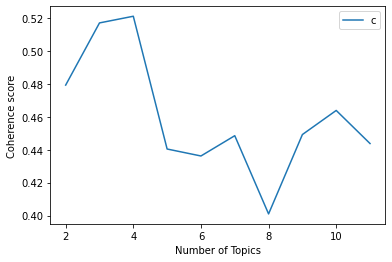

In [ ]:
plot_graph(dictionary, tfidf, lem_text, start, stop, step, model_list, coherence_values)

По графику согласованности видно, что оптимальное количество тем равно четырем

Теперь посмотрим на основные слова в каждой теме с весами

In [ ]:
index = coherence_values.index(max(coherence_values))
result = model_list[index].show_topics()

for i in range(len(result)):
  print(result[i][1]) 

-0.268*"cell" + -0.218*"gene" + -0.160*"protein" + -0.126*"c" + -0.119*"development" + -0.119*"mutation" + -0.111*"mutant" + -0.110*"nematode" + -0.104*"sequence" + -0.097*"genetic"
0.496*"cell" + 0.264*"death" + -0.207*"sequence" + 0.192*"fate" + 0.155*"programmed" + 0.141*"vulval" + -0.129*"gene" + 0.128*"division" + 0.116*"lineage" + -0.107*"genome"
0.999*"french" + -0.005*"loss" + 0.005*"aging" + 0.004*"maternal" + 0.004*"longevity" + -0.004*"previously" + -0.004*"embryo" + -0.004*"ce" + -0.004*"new" + -0.004*"sequence"
0.242*"protein" + -0.211*"sex" + -0.193*"life" + -0.188*"aging" + -0.169*"male" + -0.154*"span" + 0.150*"sequence" + -0.146*"x" + 0.144*"kinase" + 0.140*"lin"


Смотрим на коэффициенты слов в каждом топике

In [ ]:
coeff = []
for i in range(len(result)):
  coeff_topic_num = list(map(float, re.findall(r"\d*\.\d+|\d+", result[i][1])))
  coeff.append(coeff_topic_num)

print(coeff)

[[0.268, 0.218, 0.16, 0.126, 0.119, 0.119, 0.111, 0.11, 0.104, 0.097], [0.496, 0.264, 0.207, 0.192, 0.155, 0.141, 0.129, 0.128, 0.116, 0.107], [0.999, 0.005, 0.005, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004], [0.242, 0.211, 0.193, 0.188, 0.169, 0.154, 0.15, 0.146, 0.144, 0.14]]


Слова, которые характеризуют каждый топик

In [ ]:
topics = []
for i in range(len(result)):
  topics.append(re.findall(r"[a-zA-Z]+", result[i][1]))
print(topics)

[['cell', 'gene', 'protein', 'c', 'development', 'mutation', 'mutant', 'nematode', 'sequence', 'genetic'], ['cell', 'death', 'sequence', 'fate', 'programmed', 'vulval', 'gene', 'division', 'lineage', 'genome'], ['french', 'loss', 'aging', 'maternal', 'longevity', 'previously', 'embryo', 'ce', 'new', 'sequence'], ['protein', 'sex', 'life', 'aging', 'male', 'span', 'sequence', 'x', 'kinase', 'lin']]


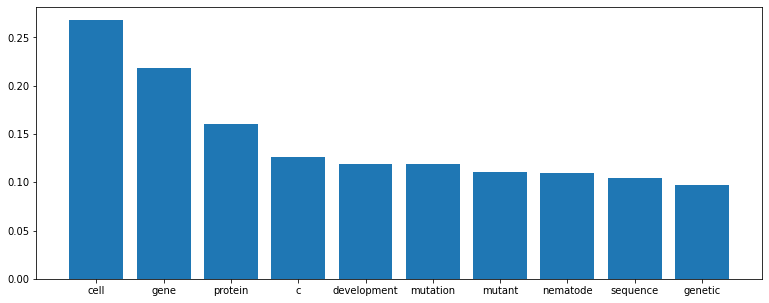

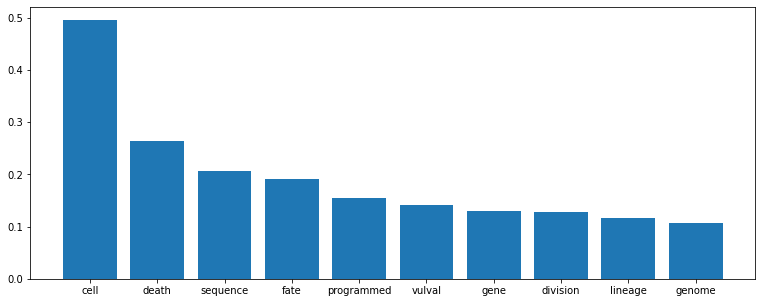

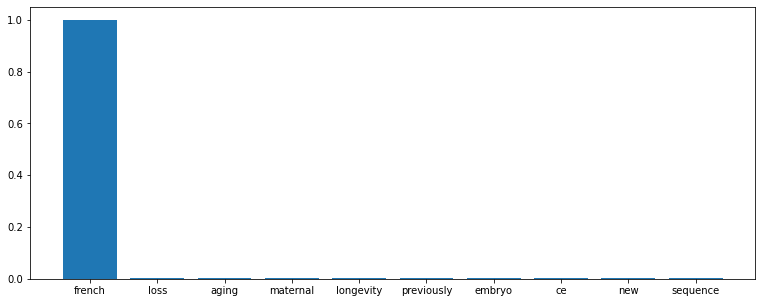

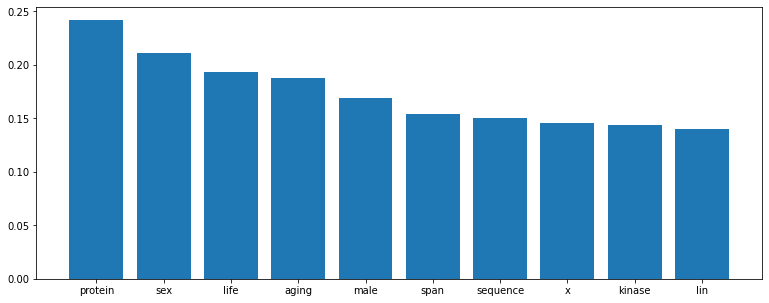

In [ ]:
#визуализируем темы с учетом полученных коэффициентов
for i in range(len(result)):
  fig, ax = plt.subplots(figsize=(13,5))
  ax.bar(topics[i], coeff[i])
  plt.show()  

 
Мы видим, что первые две темы схожи между собой: наибольший коэффициент в обеих имеет слово cell, также в обе темы входят слова gene, seguence и однокоренные слова genetic и genome.

В третьей теме только одно слово, которое характеризует её, что странно. 

В четвертой теме присутствуют мусорные слова, которые остались после предобработки даных. 

В данном случае, можно сказать, что нам нужно тчательнее предобрабатывать данные, уделяя больше внимания стоп словам и тексту после лемматиации. Также модель в этом случае сработала не совсем корректно, выделив в отдельный топик слово french.

### **LDA**

In [ ]:
# !pip install pyLDAvis
!pip install pyLDAvis==2.1.2

In [ ]:
import pyLDAvis.gensim
import pyLDAvis

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


Проделываем теже шаги для LDA модели - сначала определяем оптимальное количество тем

In [ ]:
def compute_coherence_values_lda(dictionary, doc_term_matrix, doc_clean, stop, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, stop, step):
        # generate LDA model
        random.seed(10)
        model = models.LdaModel(doc_term_matrix, num_topics=num_topics, id2word = dictionary, random_state=9)  # train model
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=doc_clean, dictionary=dictionary, coherence='c_v')
        print(coherencemodel.get_coherence())
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

In [ ]:
start,stop,step=2,12,1
model_list_l, coherence_values_l = compute_coherence_values_lda(dictionary = dictionary, doc_term_matrix = tfidf, doc_clean = lem_text, start = start, stop = stop, step = step)

In [ ]:
coherence_values_l

[0.37319463376037443,
 0.35284397072884754,
 0.36098662486766475,
 0.35901695866719446,
 0.380820879416541,
 0.36917698052799813,
 0.39099619073867065,
 0.4000616466707147,
 0.36830721892266943,
 0.4122130109144317]

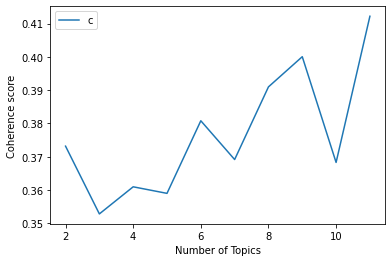

In [ ]:
plot_graph(dictionary, tfidf, lem_text, start, stop, step, model_list_l, coherence_values_l)

Видим, что в данном случае, оптимальное количество топиков равно 11, что очень много 

In [ ]:
index1 = coherence_values_l.index(max(coherence_values_l))
result1 = model_list_l[index1].show_topics()

In [ ]:
for i in range(len(result1)):
  print(result1[i][1])

0.004*"gene" + 0.004*"cell" + 0.003*"protein" + 0.003*"kinase" + 0.002*"c" + 0.002*"receptor" + 0.002*"family" + 0.002*"function" + 0.002*"apoptotic" + 0.002*"rnai"
0.003*"par" + 0.002*"gene" + 0.002*"transforming" + 0.002*"codon" + 0.002*"protein" + 0.002*"cell" + 0.001*"onecell" + 0.001*"immunity" + 0.001*"maternal" + 0.001*"rna"
0.005*"cell" + 0.004*"death" + 0.003*"gene" + 0.003*"pathway" + 0.003*"c" + 0.002*"programmed" + 0.002*"apoptosis" + 0.002*"mechanism" + 0.002*"protein" + 0.002*"ce"
0.006*"protein" + 0.004*"gene" + 0.004*"domain" + 0.003*"sequence" + 0.003*"rna" + 0.003*"family" + 0.003*"expression" + 0.003*"transcription" + 0.002*"factor" + 0.002*"gfp"
0.003*"gene" + 0.003*"cell" + 0.003*"signaling" + 0.002*"organism" + 0.002*"function" + 0.002*"pathway" + 0.002*"unc" + 0.002*"receptor" + 0.002*"development" + 0.002*"nematode"
0.005*"wnt" + 0.003*"beta" + 0.003*"udp" + 0.003*"cone" + 0.001*"age" + 0.001*"gene" + 0.001*"cation" + 0.001*"integrins" + 0.001*"transgene" + 0.00

По коэффициентам можно заметить, что матрица получилась очень разряженная

Коэффициенты слов в каждом топике

In [ ]:
coeff1 = []
for i in range(len(result1)):
  coeff_topic_num = list(map(float, re.findall(r"\d*\.\d+|\d+", result1[i][1])))
  coeff1.append(coeff_topic_num)

print(coeff1)

[[0.004, 0.004, 0.003, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002], [0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.001, 0.001, 0.001, 0.001], [0.005, 0.004, 0.003, 0.003, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002], [0.006, 0.004, 0.004, 0.003, 0.003, 0.003, 0.003, 0.003, 0.002, 0.002], [0.003, 0.003, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002], [0.005, 0.003, 0.003, 0.003, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001], [0.005, 0.004, 0.004, 0.003, 0.003, 0.003, 0.003, 0.002, 0.002, 0.002], [0.004, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002], [0.003, 0.003, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002], [0.005, 0.003, 0.003, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002]]


И сами слова, характеризующие каждый топик

In [ ]:
topics1 = []
for i in range(len(result1)):
  topics1.append(re.findall(r"[a-zA-Z]+", result1[i][1]))

print(topics1)

[['gene', 'cell', 'protein', 'kinase', 'c', 'receptor', 'family', 'function', 'apoptotic', 'rnai'], ['par', 'gene', 'transforming', 'codon', 'protein', 'cell', 'onecell', 'immunity', 'maternal', 'rna'], ['cell', 'death', 'gene', 'pathway', 'c', 'programmed', 'apoptosis', 'mechanism', 'protein', 'ce'], ['protein', 'gene', 'domain', 'sequence', 'rna', 'family', 'expression', 'transcription', 'factor', 'gfp'], ['gene', 'cell', 'signaling', 'organism', 'function', 'pathway', 'unc', 'receptor', 'development', 'nematode'], ['wnt', 'beta', 'udp', 'cone', 'age', 'gene', 'cation', 'integrins', 'transgene', 'alpha'], ['cell', 'spindle', 'germ', 'embryo', 'germline', 'c', 'division', 'protein', 'polarity', 'sperm'], ['insulin', 'gain', 'olfactory', 'axon', 'fatty', 'asymmetrically', 'guidance', 'syndrome', 'gene', 'protein'], ['x', 'chromosome', 'cell', 'mutation', 'gene', 'neuron', 'mediator', 'engulfment', 'mutant', 'c'], ['lin', 'cell', 'gene', 'heterochronic', 'rnamediated', 'q', 'telomere', 

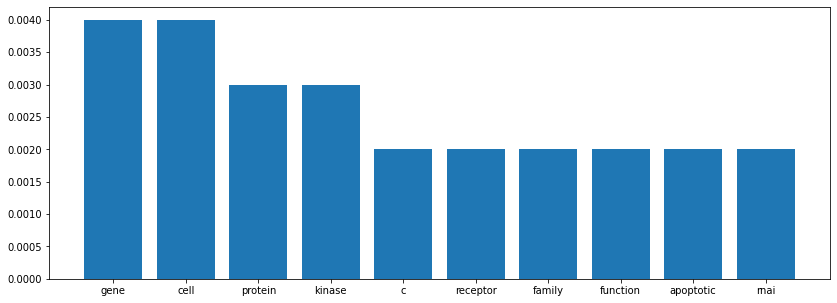

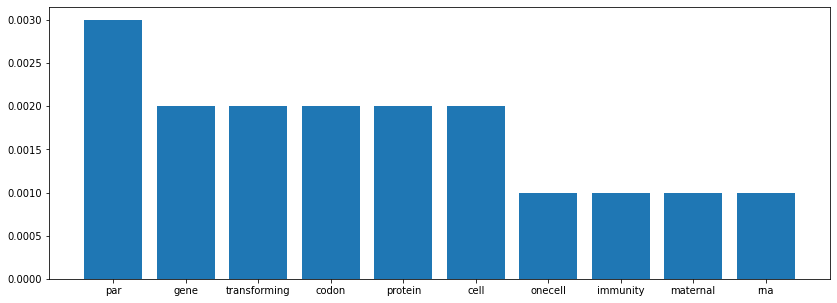

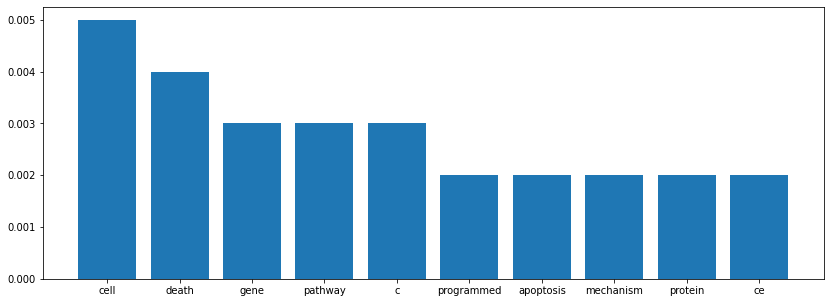

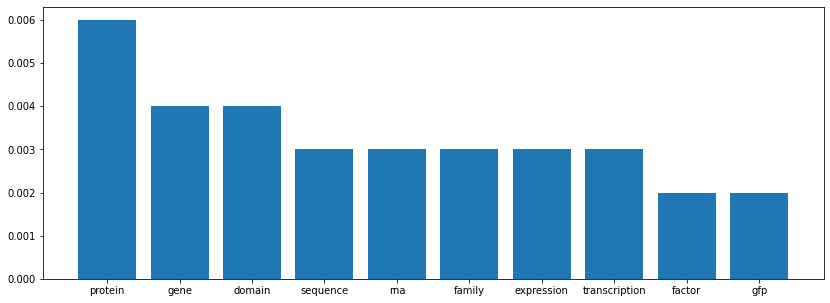

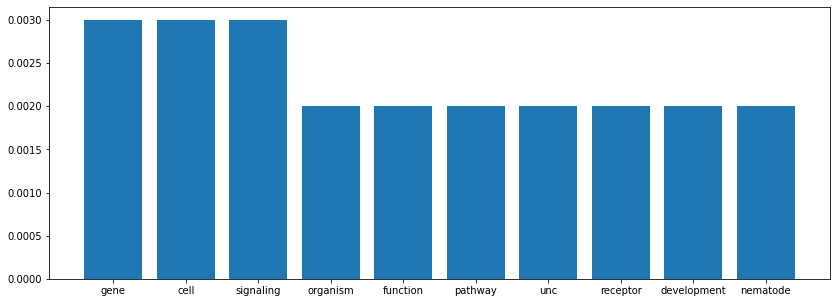

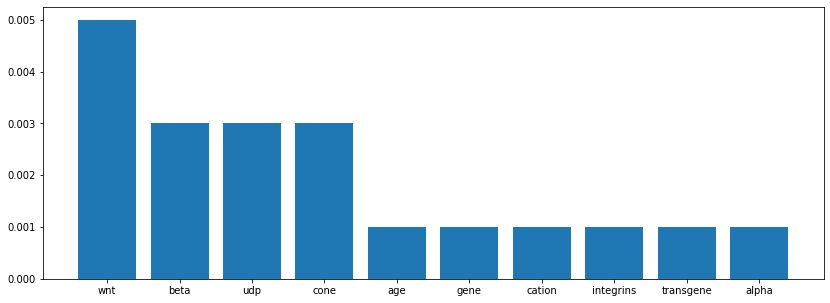

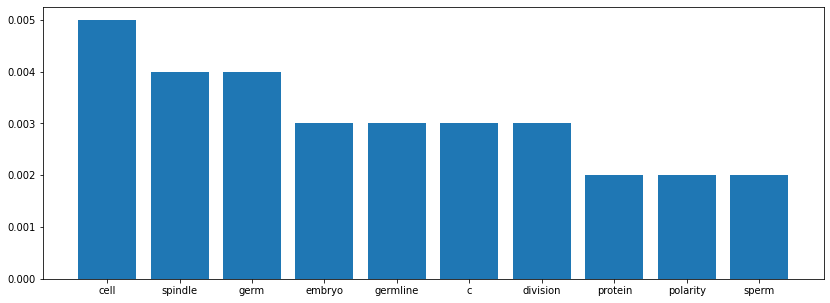

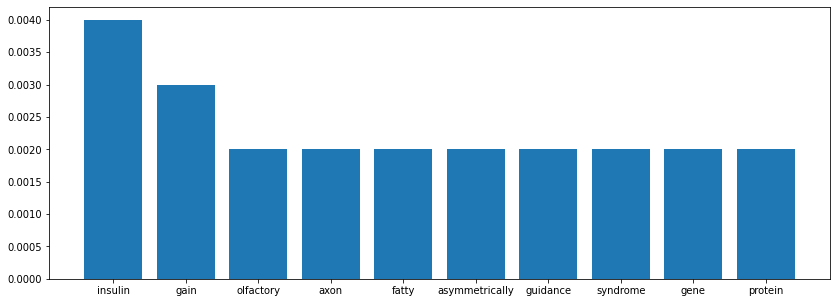

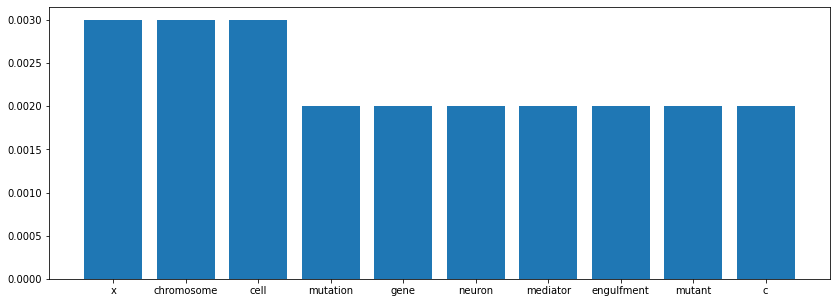

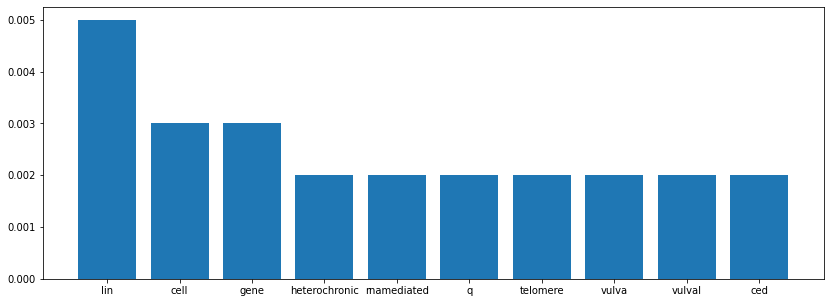

In [ ]:
#визуализируем
for i in range(len(result1)):
  fig, ax = plt.subplots(figsize=(14,5))
  ax.bar(topics1[i], coeff1[i])
  plt.show()

Мы видим, что в некоторых топиках присутствуют "мусорные" слова, многие слова повторяются в каждом топике (напимер: cell, gene, protein), поэтому их можно определять как плохие слова и исключать из корпуса текста. В целом, учитывая разряженность матрицы, характеристика текста по данным топикам станет неверным решением.

Посмотрим на еще одну визуализацию

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model_list_l[index1], corpus, model_list_l[index1].id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.102347 -0.030034       1        1  30.106583
0      0.059250  0.031806       2        1  18.159942
9      0.001220  0.112424       3        1  13.308272
8      0.043097 -0.029819       4        1  12.394349
10    -0.006992 -0.020275       5        1   9.494964
6     -0.022544 -0.007464       6        1   5.067673
4     -0.021990 -0.016074       7        1   3.094047
7     -0.023378 -0.004459       8        1   2.791007
1     -0.032007 -0.006435       9        1   2.517895
2     -0.038286 -0.019520      10        1   2.017620
3     -0.060717 -0.010150      11        1   1.047648, topic_info=          Term         Freq        Total Category  logprob  loglift
5563       lin   188.000000   188.000000  Default  30.0000  30.0000
37        cell  1087.000000  1087.000000  Default  29.0000  29.0000
395       gene  1050.000000  1050.000000  Default  28.0000  28.0000
794    protein   927.000000   927.000000  Default  27.0000  27.0000
4246   spindle   172.000000   172.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
5608      cdna     3.358569   169.685856  Topic11  -6.9600   0.6362
36           c     3.266811   722.730397  Topic11  -6.9877  -0.8406
19    nematode     3.084119   558.067004  Topic11  -7.0453  -0.6396
37        cell     3.026459  1087.142584  Topic11  -7.0642  -1.3253
106     growth     2.910917   283.443215  Topic11  -7.1031  -0.0199

[739 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
4922      1  0.022794   ace
4922      2  0.091175   ace
4922      3  0.022794   ace
4922      4  0.091175   ace
4922      5  0.729402   ace
...     ...       ...   ...
8467      4  0.014638  zinc
8467      5  0.014638  zinc
8467      6  0.043913  zinc
8467      9  0.014638  zinc
8467     10  0.014638  zinc

[4270 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 1, 10, 9, 11, 7, 5, 8, 2, 3, 4])

Видно, что многие топики сливаются друг с другом и имеют одинаковые слова. 

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model_list_l[3], corpus, model_list_l[3].id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.058049 -0.025615       1        1  49.231676
4      0.017412  0.050028       2        1  24.022874
2     -0.020871 -0.025348       3        1  11.366896
1     -0.025121  0.026306       4        1  10.137228
3     -0.029469 -0.025371       5        1   5.241326, topic_info=                Term         Freq        Total Category  logprob  loglift
794          protein   875.000000   875.000000  Default  30.0000  30.0000
37              cell  1107.000000  1107.000000  Default  29.0000  29.0000
199           neuron   350.000000   350.000000  Default  28.0000  28.0000
6250              ce    92.000000    92.000000  Default  27.0000  27.0000
929              rna   391.000000   391.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
4     caenorhabditis    15.649497   423.614172   Topic5  -7.0312  -0.3498
17            mutant    15.730542   487.152822   Topic5  -7.0260  -0.4844
334         function    15.493161   522.697423   Topic5  -7.0412  -0.5700
9            elegans    14.948432   431.275506   Topic5  -7.0770  -0.4135
1852          family    14.831137   433.850778   Topic5  -7.0849  -0.4274

[393 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
19225      1  0.291418  achaete
19225      2  0.194279  achaete
19225      3  0.097139  achaete
19225      4  0.097139  achaete
19225      5  0.388558  achaete
...      ...       ...      ...
8467       1  0.092318     zinc
8467       2  0.815479     zinc
8467       3  0.046159     zinc
8467       4  0.030773     zinc
8467       5  0.015386     zinc

[1432 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 5, 3, 2, 4])

При пяти топиках можно уже более правильно представлять смысл текста, особенно, если совместить третий и пятый топик. В итоге, для данного корпуса оптимальное число топиков сводится к четырем, как показала прошлая модель.

## **Часть 4**

Сравнение результатов

Учитывая полученные результаты, можно сказать, что первая модель (LSI) сработала лучше. 

Во-первых, в LSI мы получили более реалистичное количество оптимальных тем, чем в LDA (4 и 11).

Во-вторых, в LDA матрица получилось слишком разряженной (что могло привести к большому количеству топиков). 

В обоих случаях в топиках находились одинаковые или похожие по смыслу слова, присутствовали "мусорные" слова. Это говорит о том, что мы должны более качественно предобрабатывать текст, а данные слова можно определять как "bad-word" и удалять их из корпуса текста. 

По итогу, стоит отметить, что хоть LDA извлекает большее количетсво слов и топиков, по сравнению с LSI, это не всегда помогает в конечной цели характеристике текста. Например, в данном примере, модель LSI дала более осмысленный результат. 